# Homeostasis à-la-SparseNet on the activation probability

In this notebook, we test the convergence of SparseNet as a function of different learning parameters. This shows the relative robusteness of this method according to the coding parameters, but also the importance of homeostasis to obtain an efficient set of filters.

See also :
* http://blog.invibe.net/posts/2015-05-05-reproducing-olshausens-classical-sparsenet.html for a description of how SparseNet is implemented in the scikit-learn package
* http://blog.invibe.net/posts/2015-05-06-reproducing-olshausens-classical-sparsenet-part-2.html for a descrtiption of how we managed to implement the homeostasis

In [ ]:
%load_ext autoreload
%autoreload 2

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
np.set_printoptions(precision=2, suppress=True)

In [2]:
from shl_scripts.shl_experiments import SHL

DEBUG_DOWNSCALE, verbose = 10, 0
DEBUG_DOWNSCALE, verbose = 10, 100
DEBUG_DOWNSCALE, verbose = 1, 10
N_scan = 7
tag = 'EMP'
opts = dict(DEBUG_DOWNSCALE=DEBUG_DOWNSCALE, homeo_method=tag, verbose=verbose)
shl = SHL(**opts)
data = shl.get_data(matname='data')
list_figures = ['show_dico', 'time_plot_error']#, 'plot_variance',  'plot_variance_histogram',  'time_plot_prob',  'time_plot_kurt',  'time_plot_var']

Extracting data..loading the data called : /tmp/data_cache/data_data
Data is of shape : (81920, 576) - done in 0.49s.


## Homeostasis à-la-SparseNet on the activation probability

alpha= 0.0002
loading the dico called : /tmp/data_cache/EMP - alpha=0.0002_dico.pkl


/usr/local/lib/python3.6/site-packages/matplotlib/figure.py:418: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


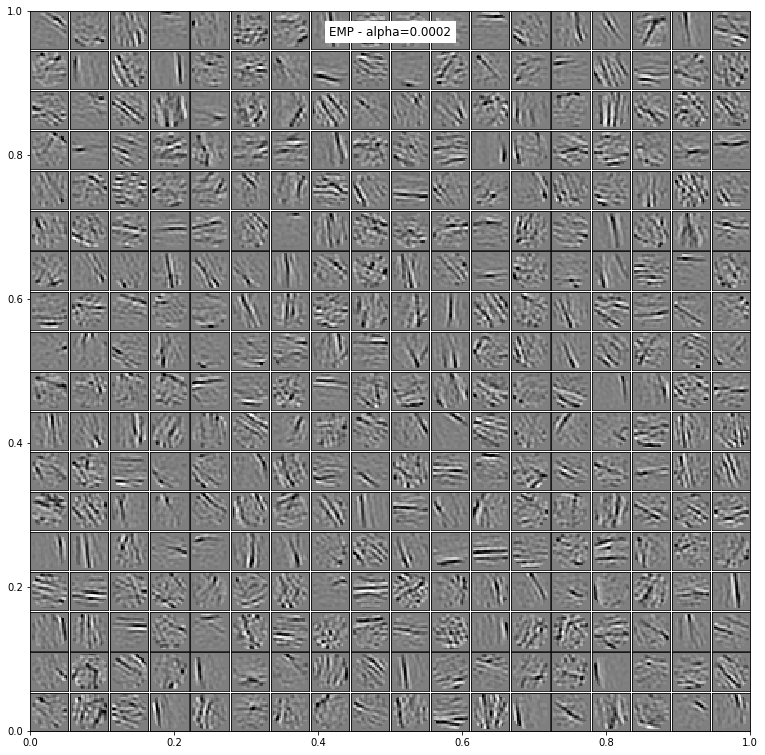

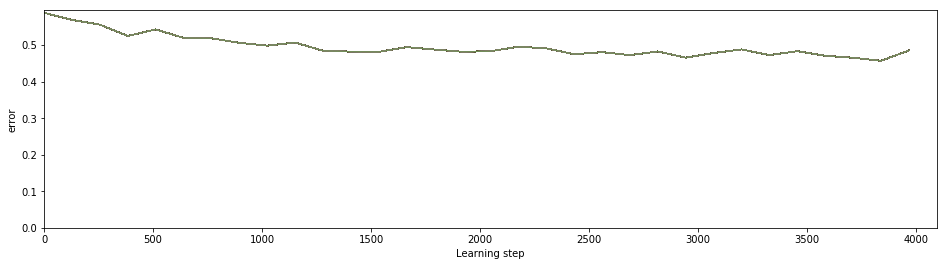

alpha= 0.0004308869380063767
loading the dico called : /tmp/data_cache/EMP - alpha=0.0004308869380063767_dico.pkl


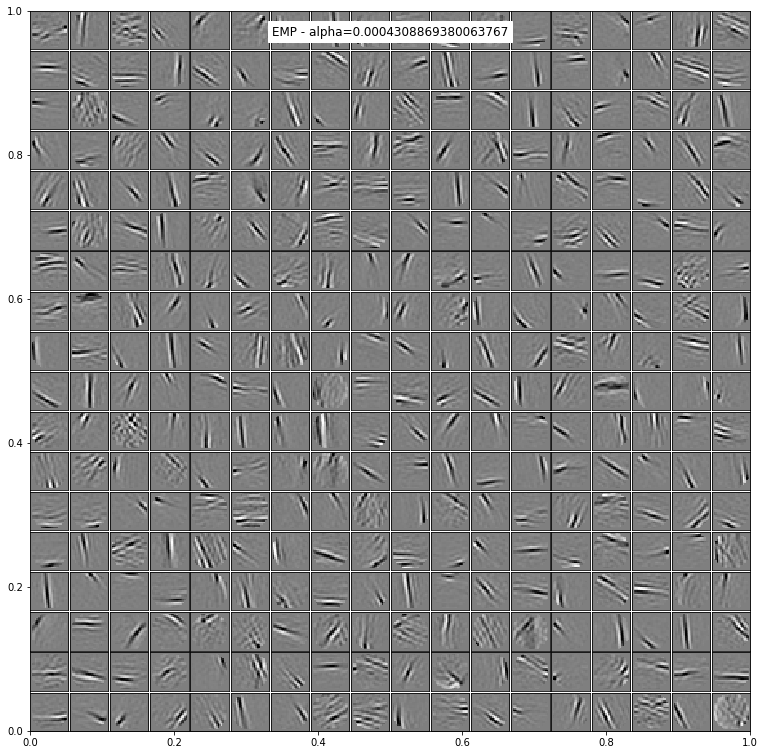

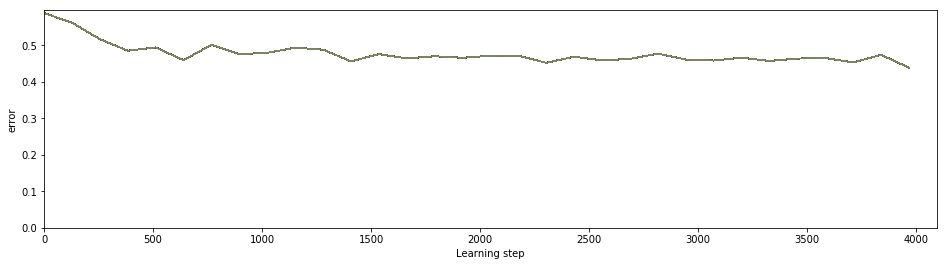

alpha= 0.0009283177667225558
loading the dico called : /tmp/data_cache/EMP - alpha=0.0009283177667225558_dico.pkl


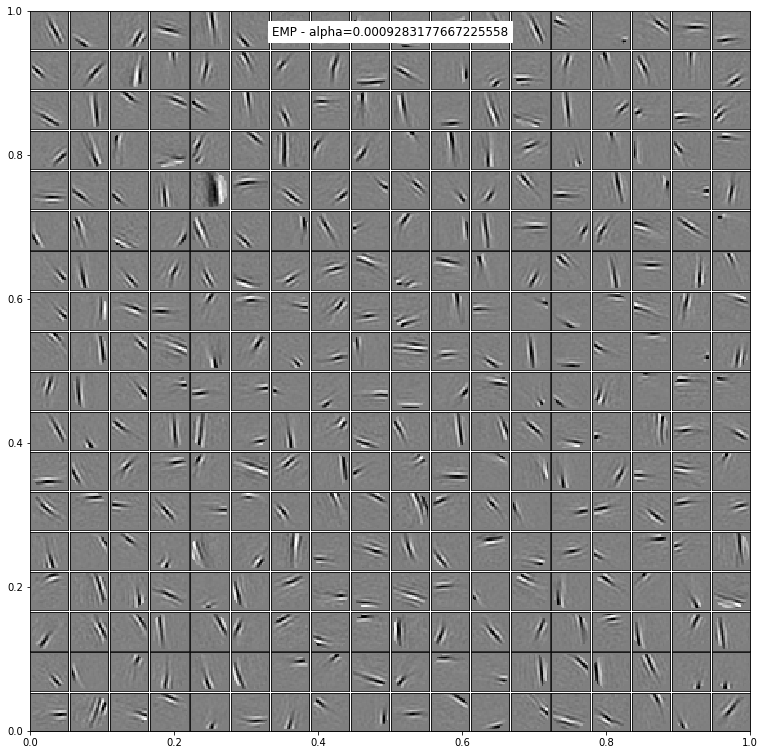

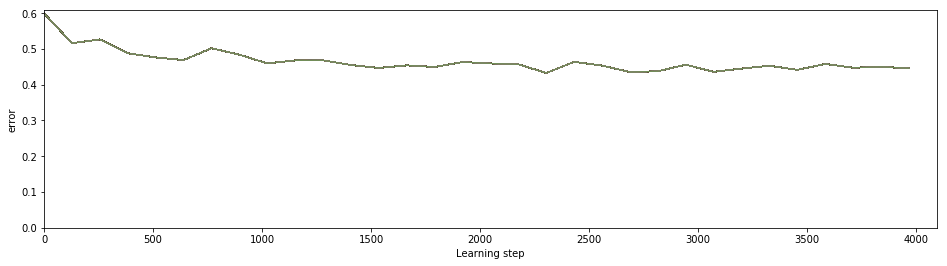

alpha= 0.002
loading the dico called : /tmp/data_cache/EMP - alpha=0.002_dico.pkl


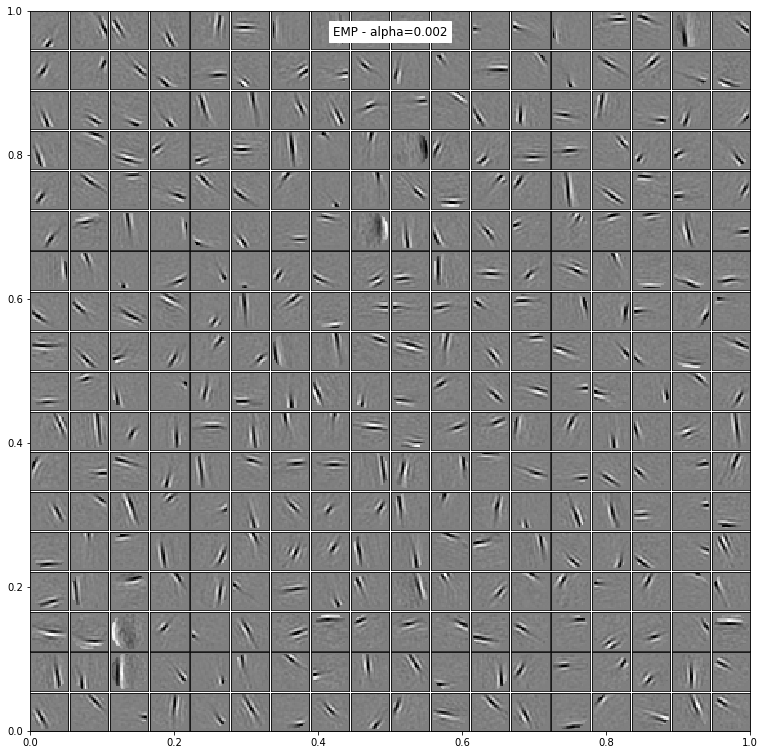

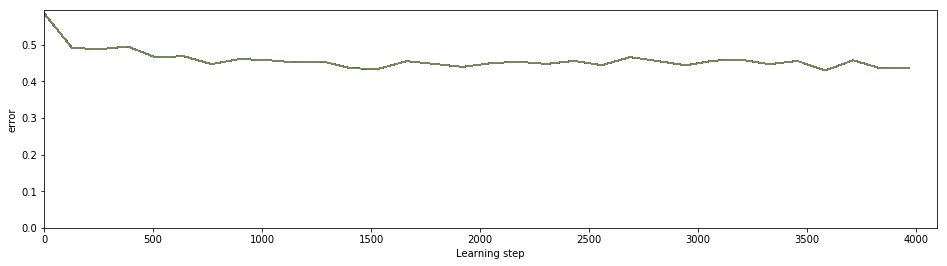

alpha= 0.004308869380063767
loading the dico called : /tmp/data_cache/EMP - alpha=0.004308869380063767_dico.pkl


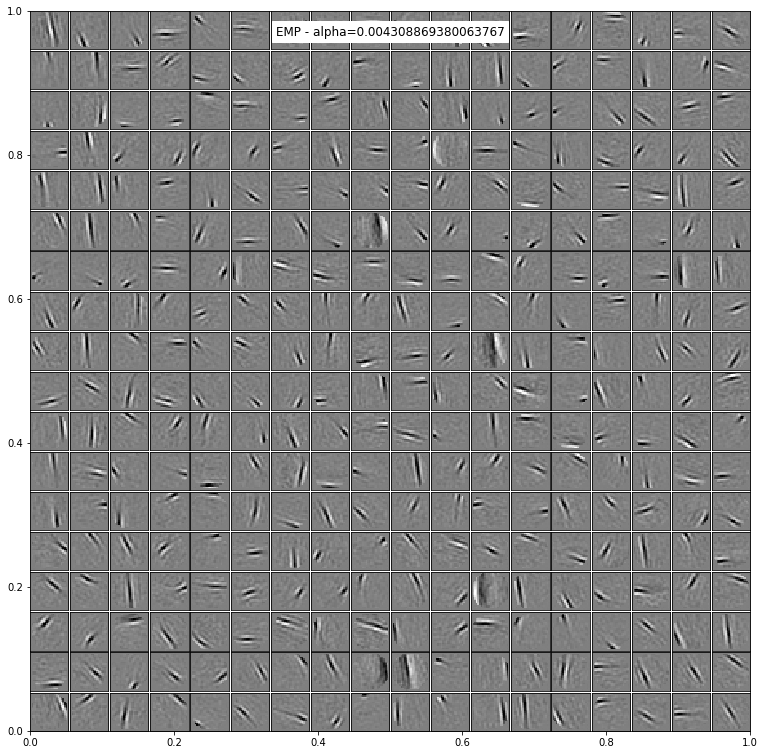

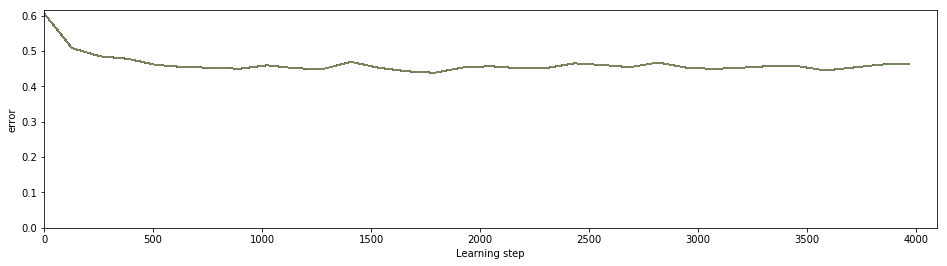

alpha= 0.009283177667225554
loading the dico called : /tmp/data_cache/EMP - alpha=0.009283177667225554_dico.pkl


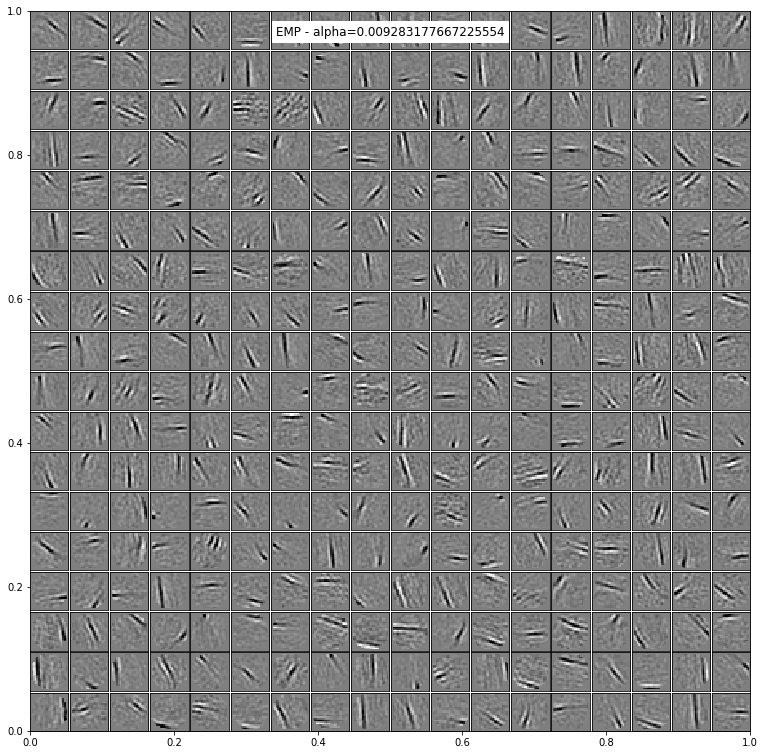

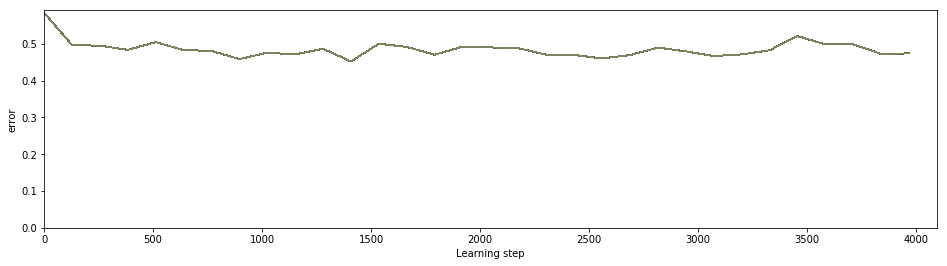

alpha= 0.02
loading the dico called : /tmp/data_cache/EMP - alpha=0.02_dico.pkl


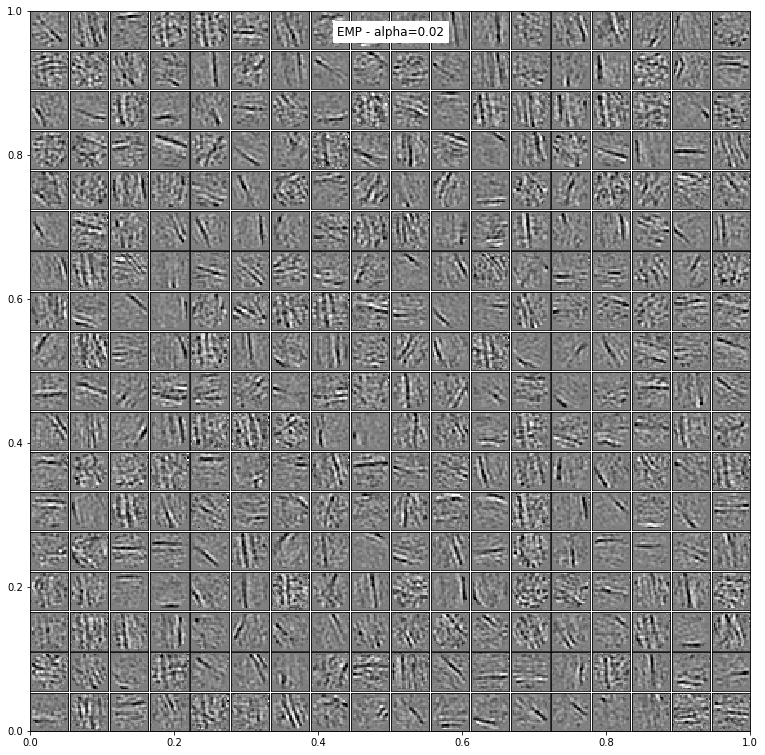

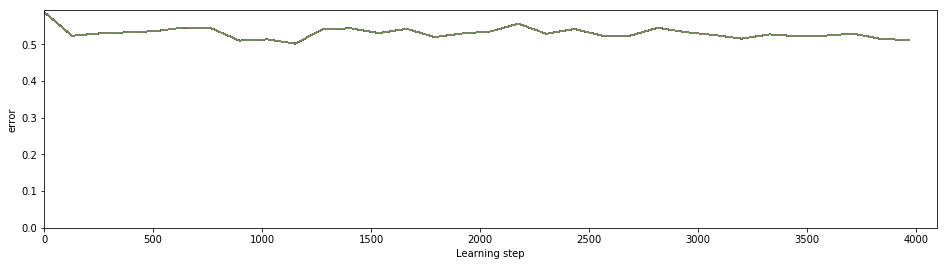

In [3]:
for alpha in np.logspace(-1, 1, N_scan, base=10)*SHL(**opts).eta['alpha']:
    shl = SHL(**opts)
    matname = tag + ' - alpha={}'.format(alpha)
    shl.eta.update(alpha=alpha)
    print('alpha=', shl.eta['alpha'])
    dico = shl.learn_dico(data=data, matname=matname, list_figures=list_figures)    
    plt.show()    

alpha= 0.02
loading the dico called : /tmp/data_cache/EMP - eta_homeo=0.005000000000000001_dico.pkl


/usr/local/lib/python3.6/site-packages/matplotlib/figure.py:418: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


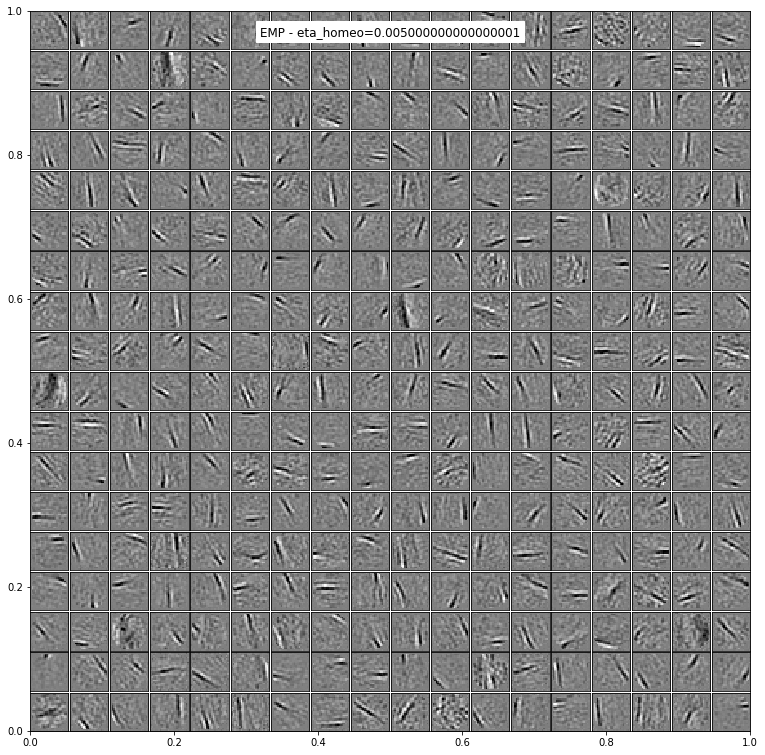

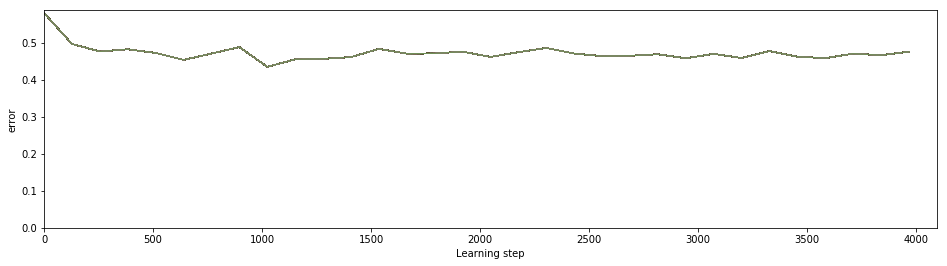

alpha= 0.02
loading the dico called : /tmp/data_cache/EMP - eta_homeo=0.010772173450159418_dico.pkl


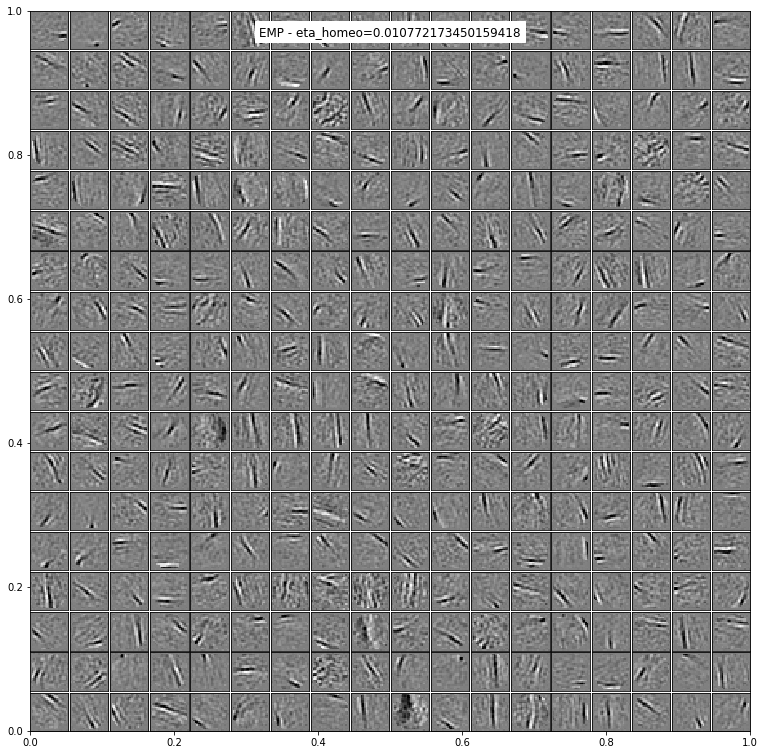

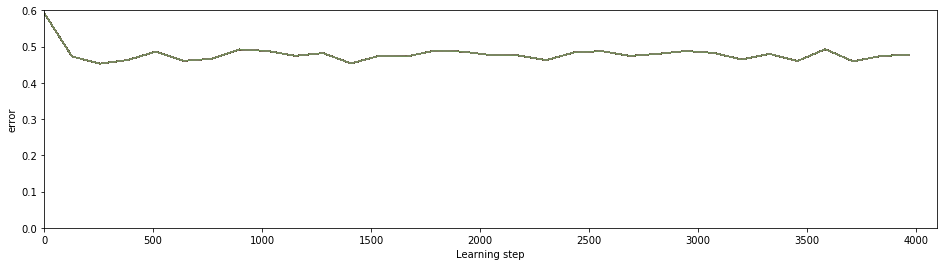

alpha= 0.02
loading the dico called : /tmp/data_cache/EMP - eta_homeo=0.023207944168063894_dico.pkl


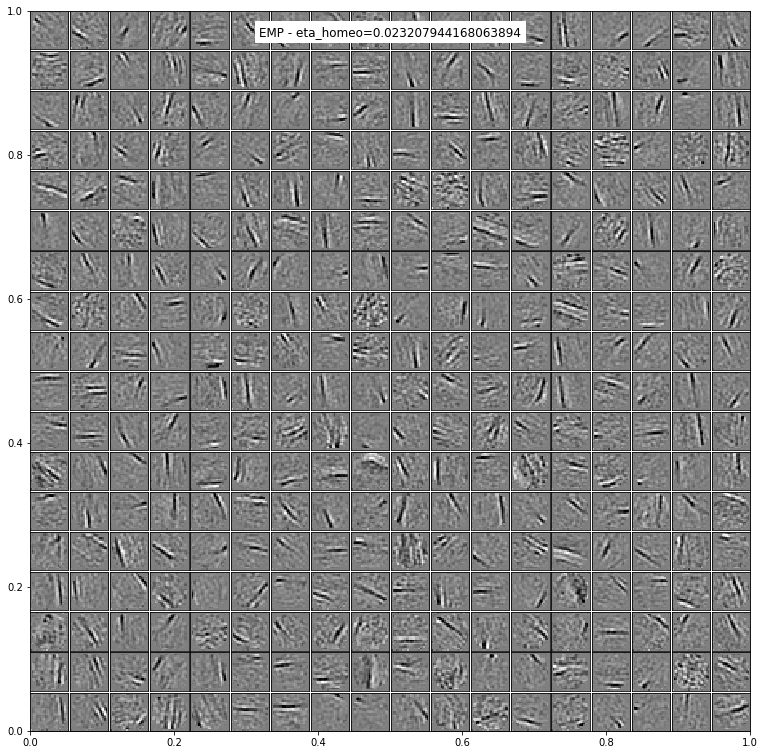

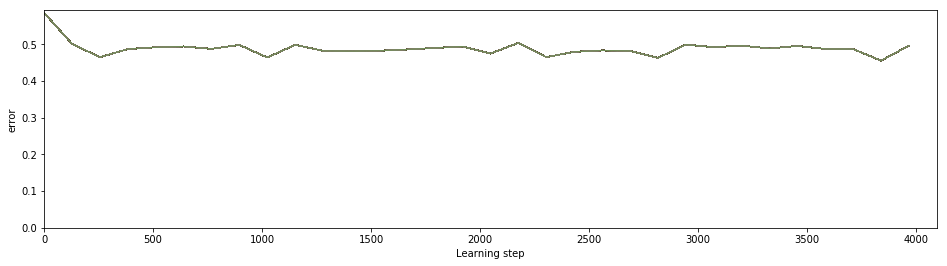

alpha= 0.02
loading the dico called : /tmp/data_cache/EMP - eta_homeo=0.05_dico.pkl


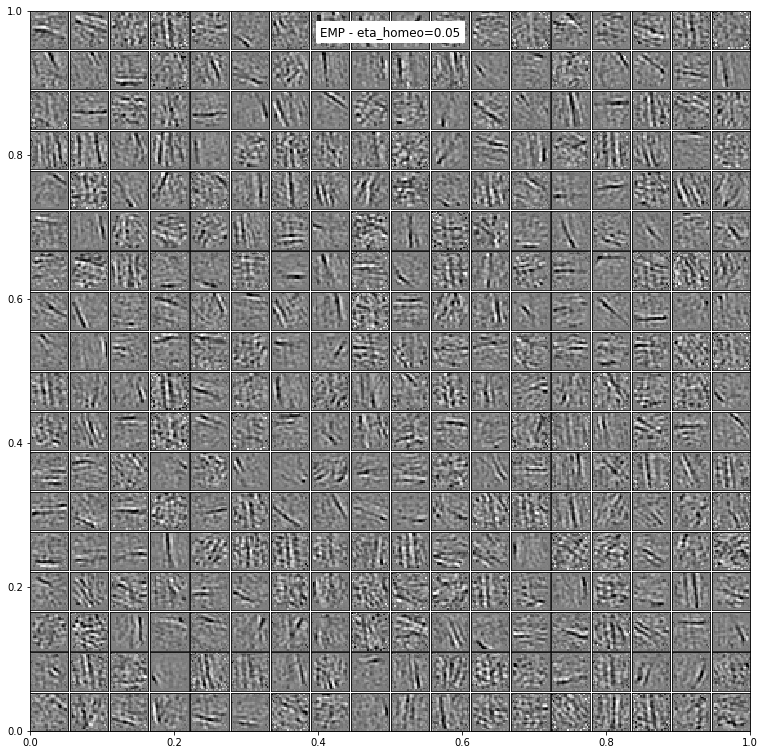

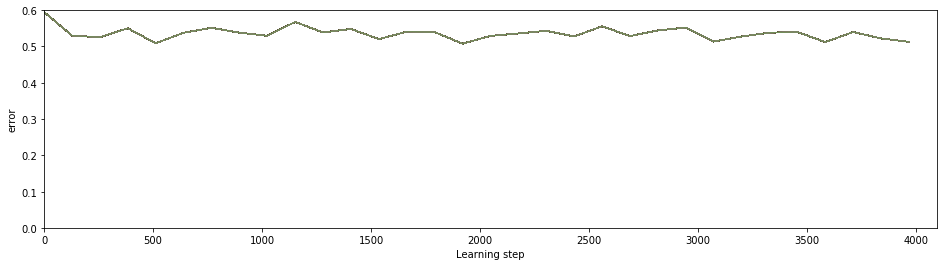

alpha= 0.02
loading the dico called : /tmp/data_cache/EMP - eta_homeo=0.10772173450159417_dico.pkl


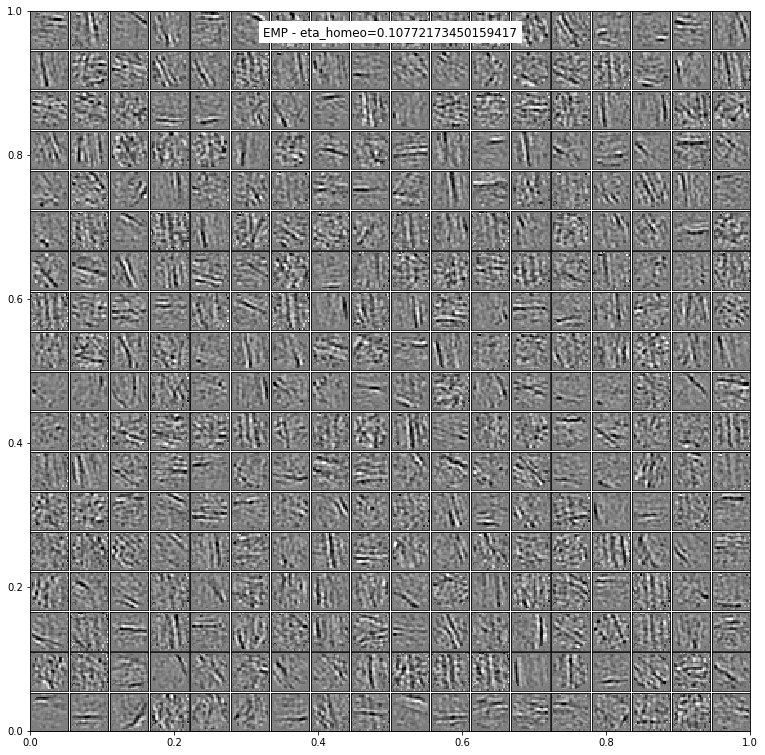

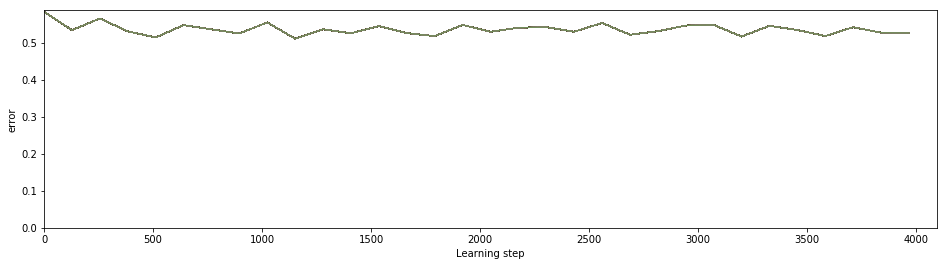

alpha= 0.02
loading the dico called : /tmp/data_cache/EMP - eta_homeo=0.23207944168063888_dico.pkl


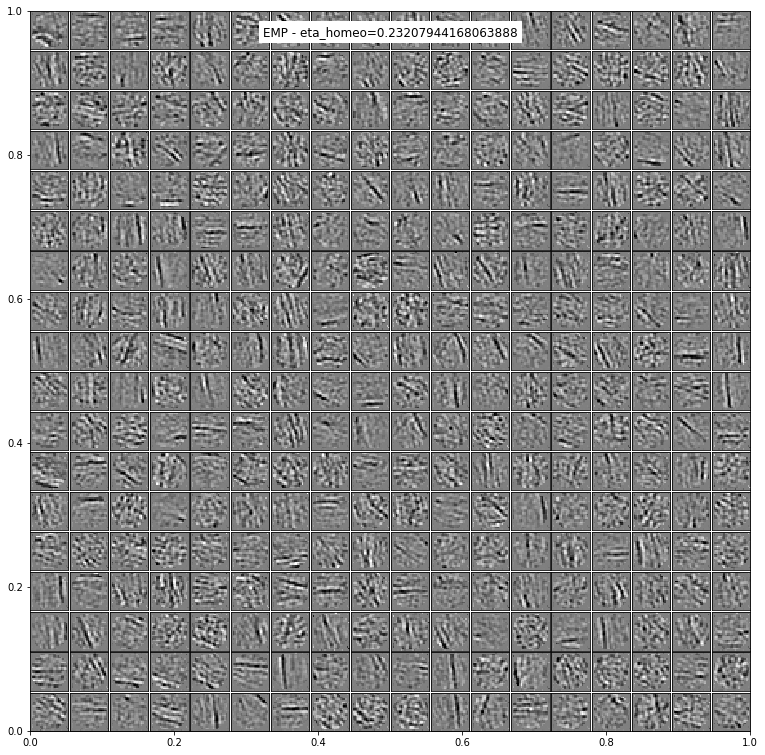

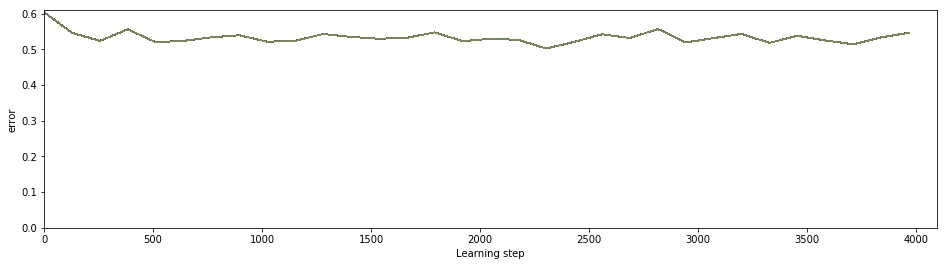

alpha= 0.02
loading the dico called : /tmp/data_cache/EMP - eta_homeo=0.5_dico.pkl


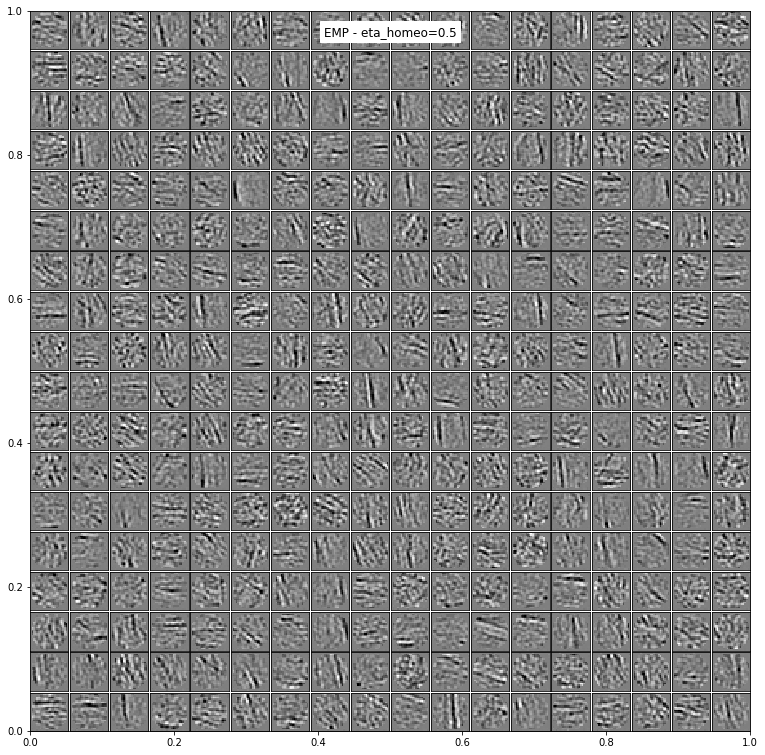

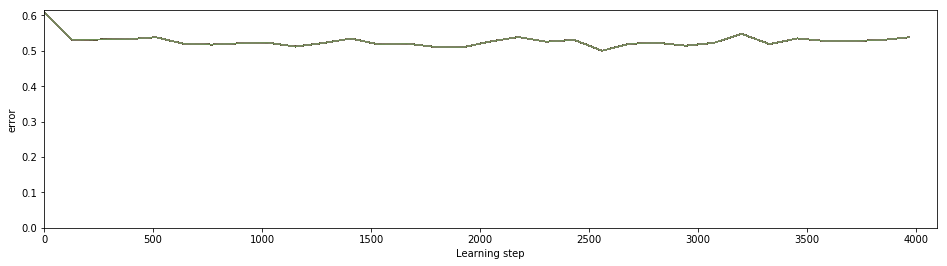

In [4]:
for eta_homeo in np.logspace(-1, 1, N_scan, base=10)*SHL(**opts).homeo_params['eta_homeo']:
    shl = SHL(**opts)    
    matname = tag + ' - eta_homeo={}'.format(eta_homeo)
    shl.homeo_params.update(eta_homeo=eta_homeo)
    print('alpha=', shl.eta['alpha'])
    dico = shl.learn_dico(data=data, matname=matname, list_figures=list_figures)    
    plt.show()

alpha= 0.02
loading the dico called : /tmp/data_cache/EMP - alpha_homeo=0.002_dico.pkl


/usr/local/lib/python3.6/site-packages/matplotlib/figure.py:418: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


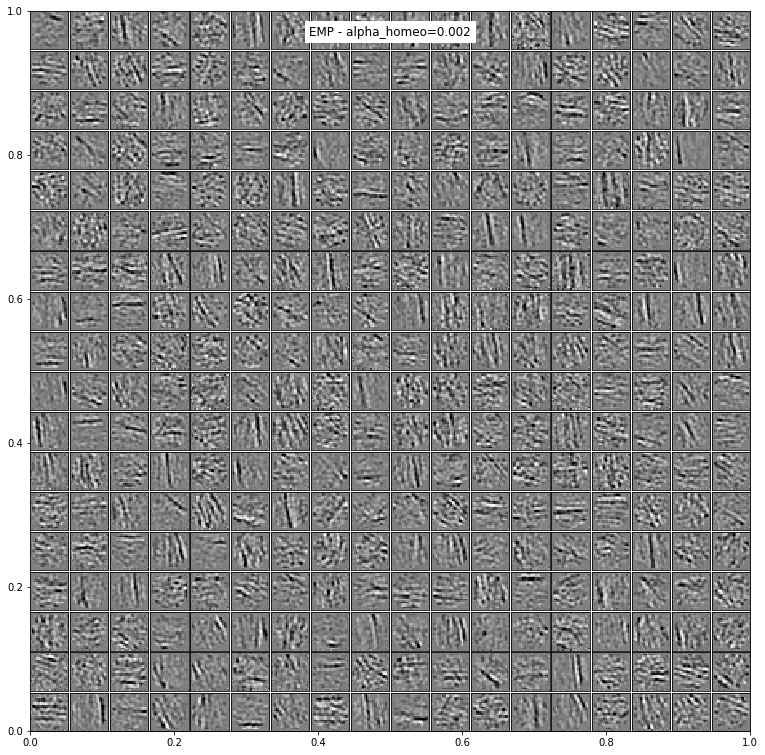

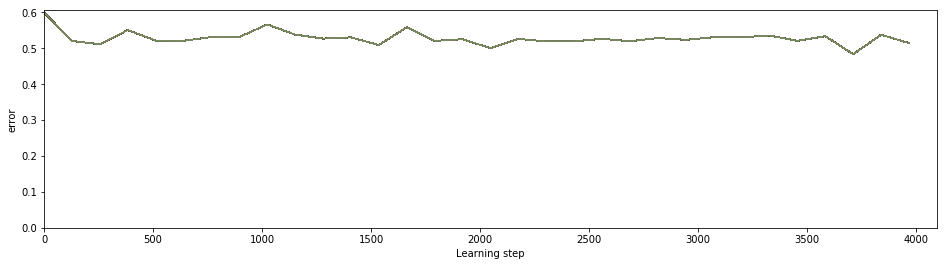

alpha= 0.02
loading the dico called : /tmp/data_cache/EMP - alpha_homeo=0.0034226566083235613_dico.pkl


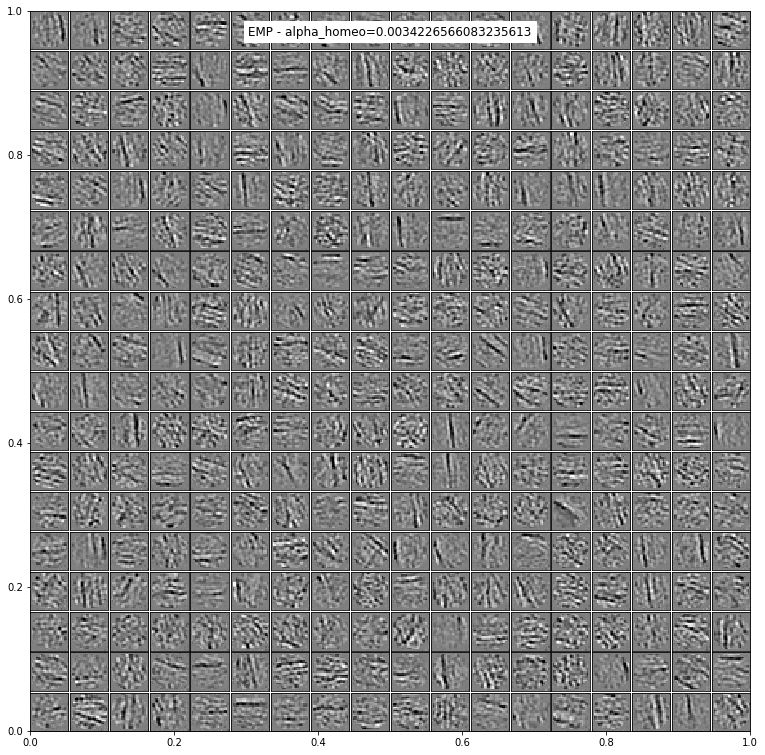

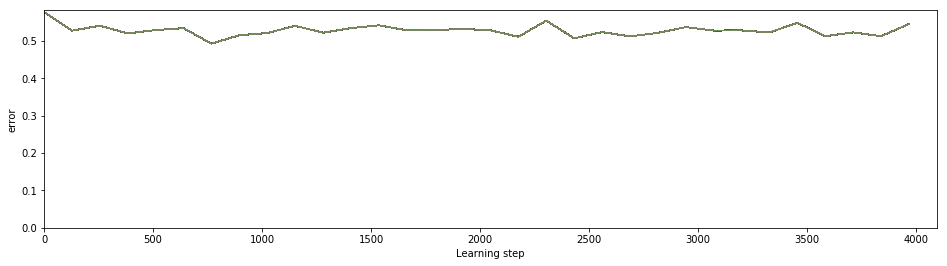

alpha= 0.02
loading the dico called : /tmp/data_cache/EMP - alpha_homeo=0.005857289129250471_dico.pkl


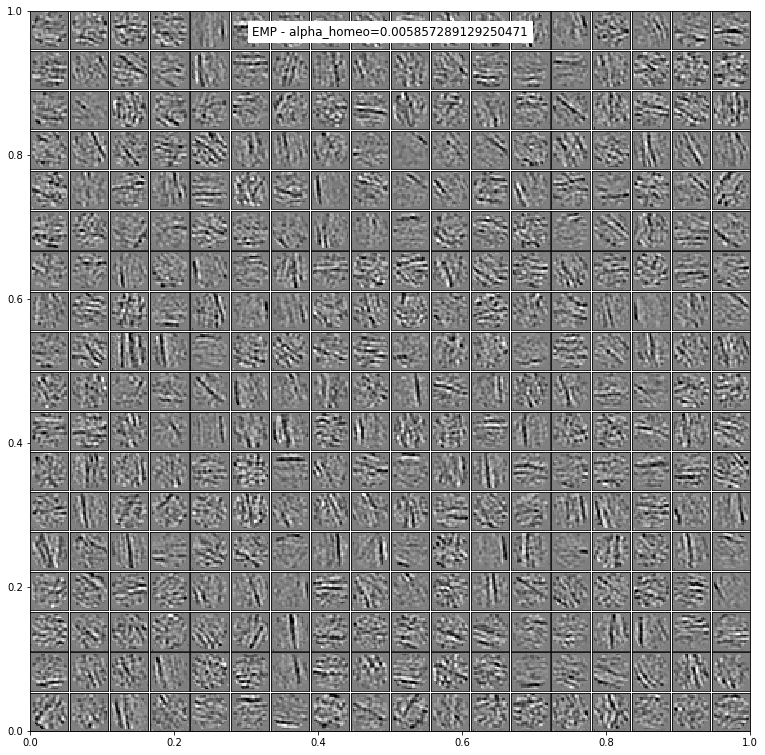

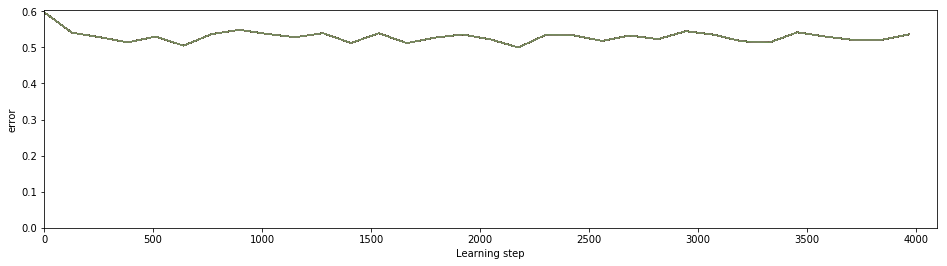

alpha= 0.02
loading the dico called : /tmp/data_cache/EMP - alpha_homeo=0.010023744672545446_dico.pkl


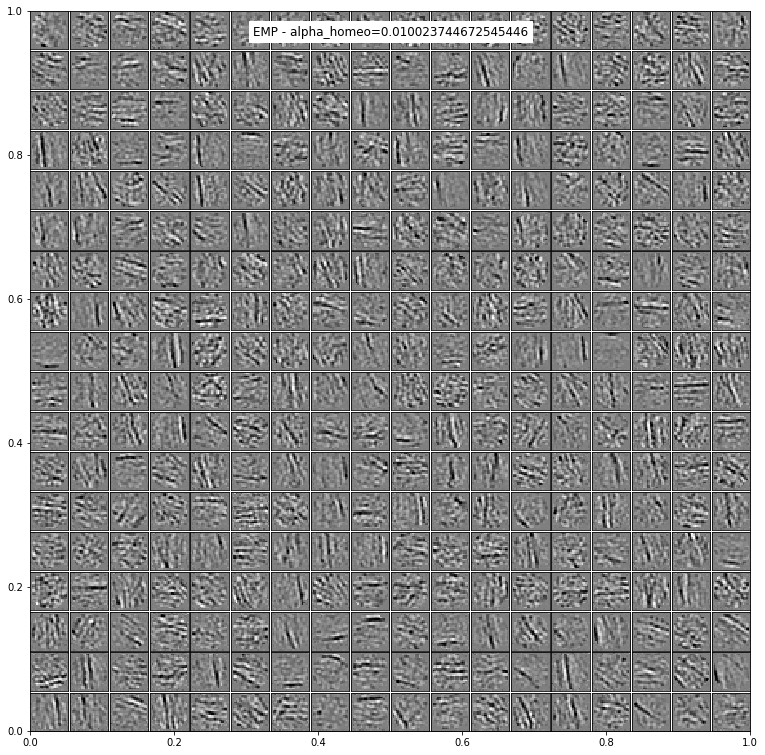

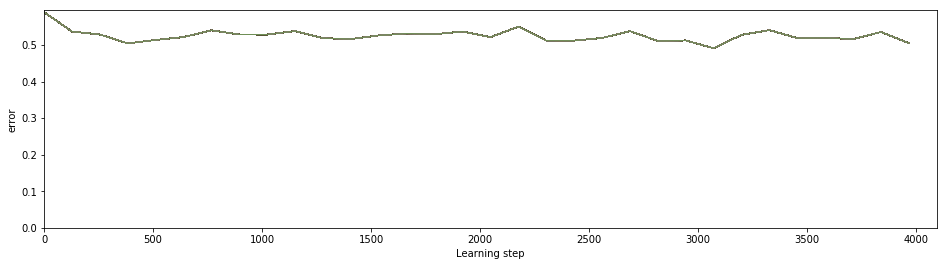

alpha= 0.02
loading the dico called : /tmp/data_cache/EMP - alpha_homeo=0.017153917971817877_dico.pkl


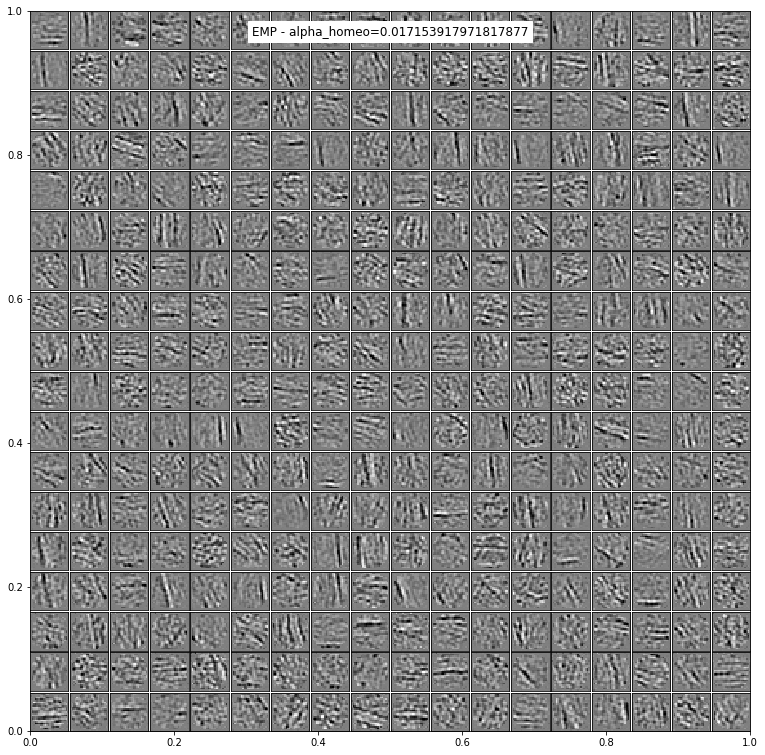

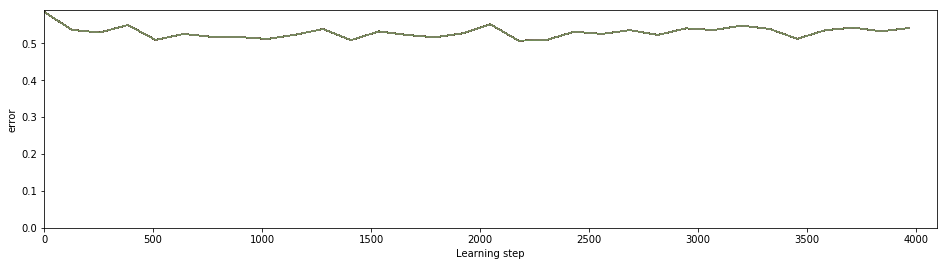

alpha= 0.02
loading the dico called : /tmp/data_cache/EMP - alpha_homeo=0.029355985352441383_dico.pkl


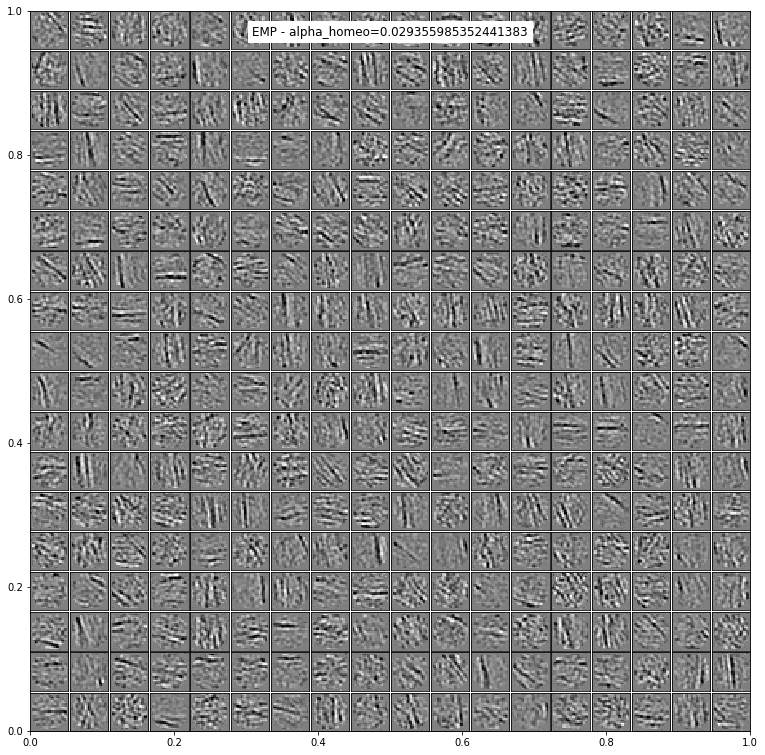

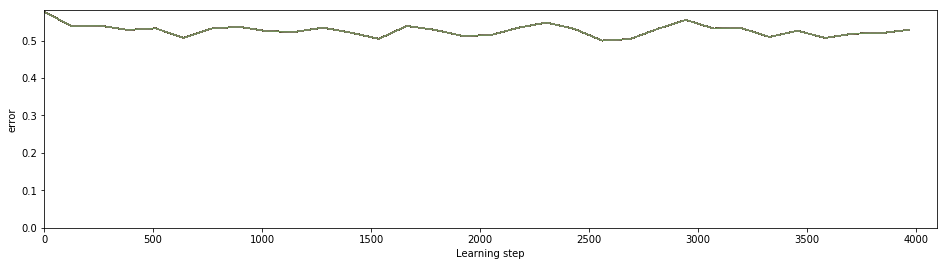

alpha= 0.02
loading the dico called : /tmp/data_cache/EMP - alpha_homeo=0.0502377286301916_dico.pkl


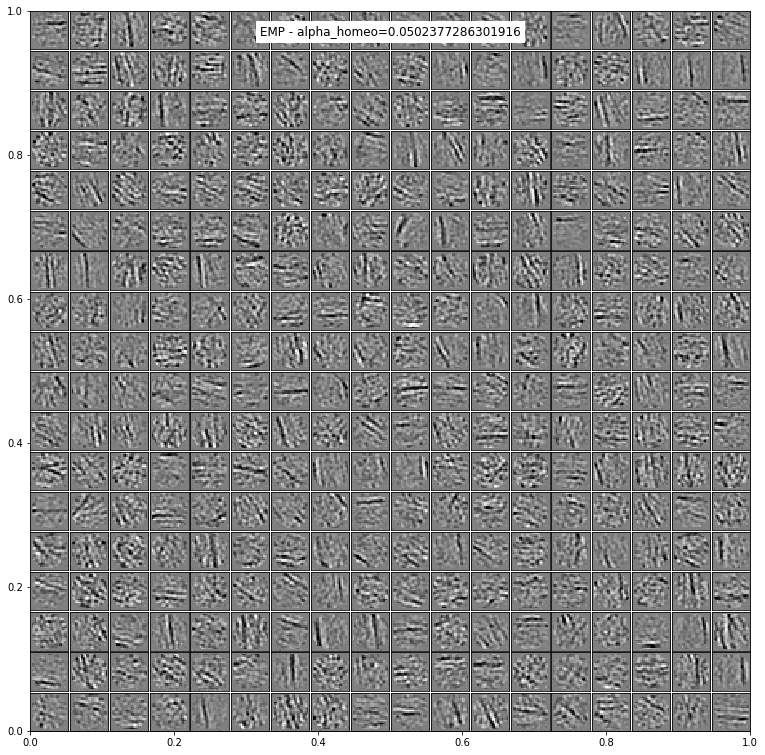

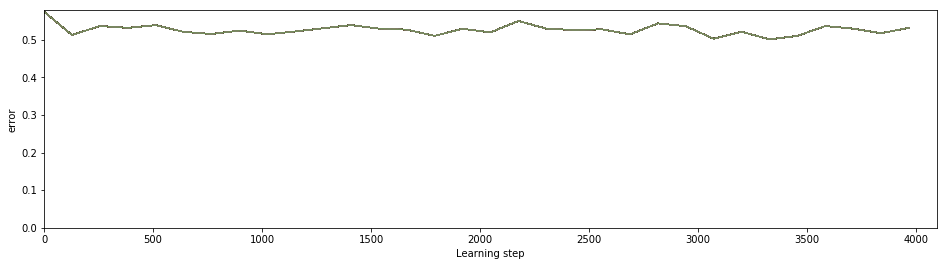

In [5]:
for alpha_homeo in np.logspace(-1, 0.4, N_scan, base=10)*SHL(**opts).homeo_params['alpha_homeo']:
    shl = SHL(**opts)    
    matname = tag + ' - alpha_homeo={}'.format(alpha_homeo)
    shl.homeo_params.update(alpha_homeo=alpha_homeo)
    print('alpha=', shl.eta['alpha'])
    dico = shl.learn_dico(data=data, matname=matname, list_figures=list_figures)
    plt.show()    

## Version used

In [6]:
%load_ext version_information
%version_information numpy, shl_scripts

Software versions
Python 3.6.4 64bit [GCC 4.2.1 Compatible Apple LLVM 9.0.0 (clang-900.0.39.2)]
IPython 6.2.1
OS Darwin 17.3.0 x86_64 i386 64bit
numpy 1.14.0
shl_scripts 20171221
Fri Jan 19 13:26:00 2018 CET